##  Linear Regression 

- Dataset: bike sharing dataset- 서울시 공용자전거(2017-2018)
- FLOW

In [1]:
import sklearn
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.linear_model
import missingno as msno
%matplotlib inline

In [2]:
# data 불러오기불러오기
bike = pd.read_csv("datas/SeoulBikeData.csv", encoding='cp949')
bike

,Date,Rented Bike Count,Hour,Temperature(캜),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(캜),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


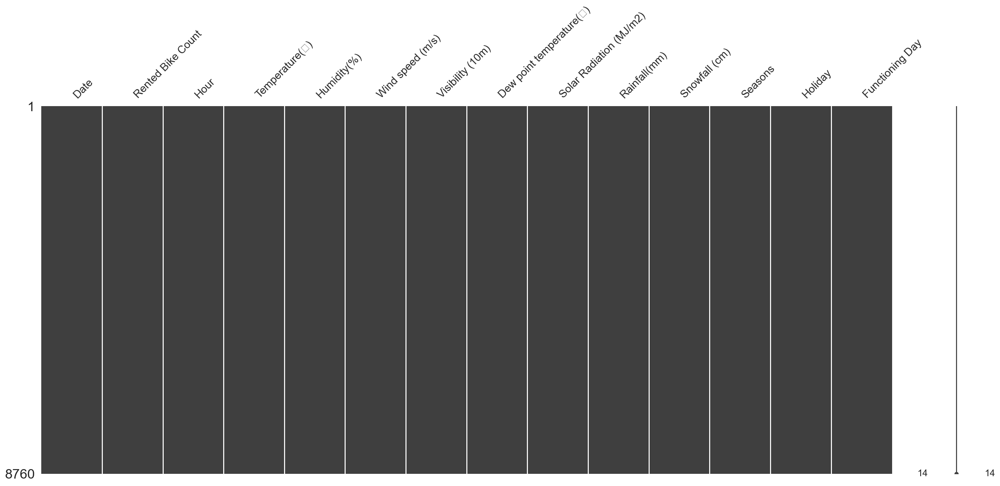

In [3]:
msno.matrix(bike);

In [4]:
# 컬럼명 변경 컬럼명 변경
bike.rename(columns={"Temperature(캜)": "Temperature(℃)", "Dew point temperature(캜)": "Dew point Temperature(℃)"}, inplace=True)

### 1. 데이터 살펴보기 (전처리 : 피처설정/ 피처정규화)

In [5]:
bike.shape

(8760, 14)

In [6]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8760 non-null   object 
 1   Rented Bike Count         8760 non-null   int64  
 2   Hour                      8760 non-null   int64  
 3   Temperature(℃)            8760 non-null   float64
 4   Humidity(%)               8760 non-null   int64  
 5   Wind speed (m/s)          8760 non-null   float64
 6   Visibility (10m)          8760 non-null   int64  
 7   Dew point Temperature(℃)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)   8760 non-null   float64
 9   Rainfall(mm)              8760 non-null   float64
 10  Snowfall (cm)             8760 non-null   float64
 11  Seasons                   8760 non-null   object 
 12  Holiday                   8760 non-null   object 
 13  Functioning Day           8760 non-null   object 
dtypes: float

In [7]:
# 형변환 ()
#bike = bike.apply(pd.to_numeric, errors='coerce')
#bike['Date']=bike['Date'].astype('float')
#bike['Seasons']=bike['Seasons'].astype('float')
#bike['Holiday']=bike['Holiday'].astype('float')

In [8]:
bike.describe()

,Rented Bike Count,Hour,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [9]:
bike

,Date,Rented Bike Count,Hour,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


#### 자전거 대여 횟수 분포

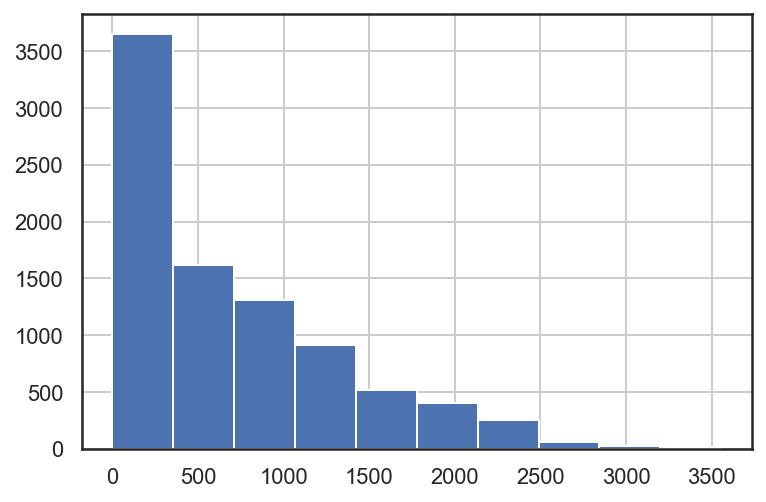

In [10]:
bike["Rented Bike Count"].hist();

#### 자전거 대여 횟수 상자그림

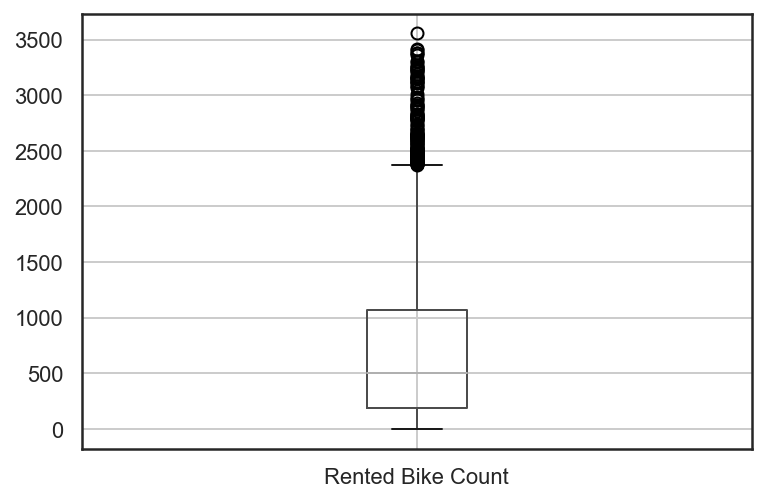

In [11]:
bike.boxplot(column=["Rented Bike Count"]);

### 1-1. 피처설정

In [12]:
bike.drop(['Date','Hour', 'Functioning Day','Seasons', 'Holiday'], axis=1, inplace=True)
#'Holiday'  원핫 인코딩
# bike["Seasons"]  Drop 이유 : 계절보다 일별, 시간대 데이터의 영향을 우선/다중공선성 우려
bike

,Rented Bike Count,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
8755,1003,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0
8756,764,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0
8757,694,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0
8758,712,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0


#### 피처 살펴보기 (피처설정)

In [13]:
# 피쳐 히스토그램으로 그려서 비교하기 (features 빠지는 거 확인)
features = bike[['Rented Bike Count', 'Temperature(℃)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point Temperature(℃)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]

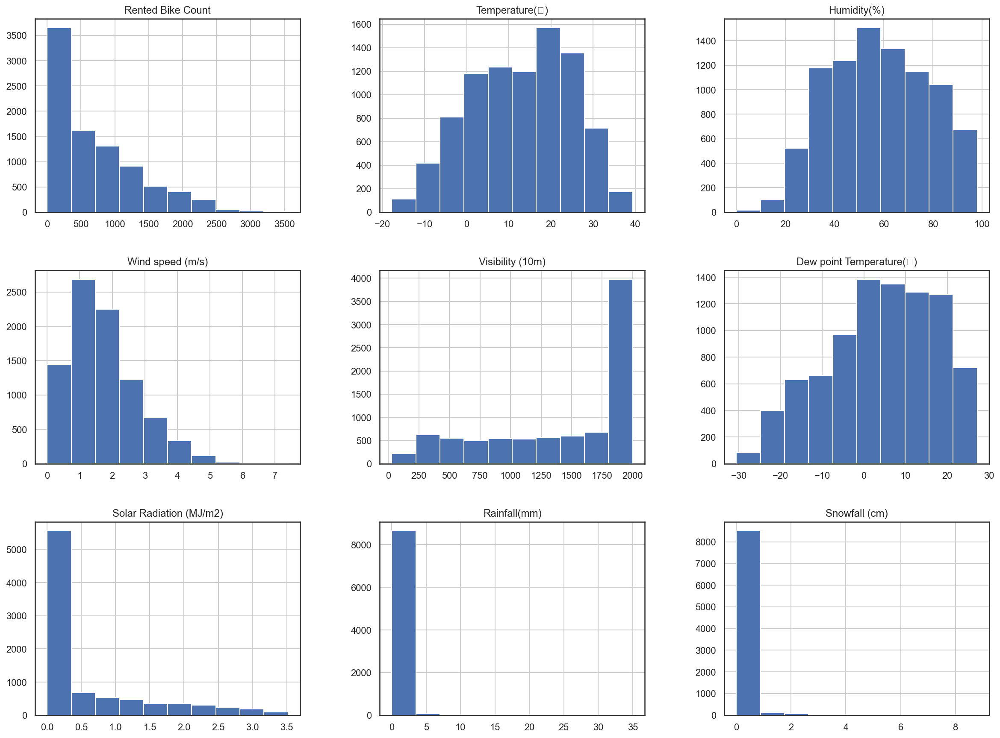

In [14]:
bike.hist(bins=10, figsize=(20,15));

In [15]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Rented Bike Count         8760 non-null   int64  
 1   Temperature(℃)            8760 non-null   float64
 2   Humidity(%)               8760 non-null   int64  
 3   Wind speed (m/s)          8760 non-null   float64
 4   Visibility (10m)          8760 non-null   int64  
 5   Dew point Temperature(℃)  8760 non-null   float64
 6   Solar Radiation (MJ/m2)   8760 non-null   float64
 7   Rainfall(mm)              8760 non-null   float64
 8   Snowfall (cm)             8760 non-null   float64
dtypes: float64(6), int64(3)
memory usage: 616.1 KB


### 2. 예측하기

- 테스트 데이터셋 분리
- 선형회귀 모델 만들기
- 회귀 분서계수 학습(회귀 모델 학습)
- 어떤 피처가 영향력이 있을까

#### 예측변수 원핫인코딩 
- 'Holiday' etc    / Holiday drop

In [16]:
#bike= pd.get_dummies(bike, ['Holiday'])

### 자전거 대여 횟수-온도

In [17]:
import plotly.express as px

fig = px.histogram(bike, x ="Rented Bike Count", y="Temperature(℃)")
fig.show()

In [18]:
bike["Rented Bike Count"].describe()

count    8760.000000
mean      704.602055
std       644.997468
min         0.000000
25%       191.000000
50%       504.500000
75%      1065.250000
max      3556.000000
Name: Rented Bike Count, dtype: float64

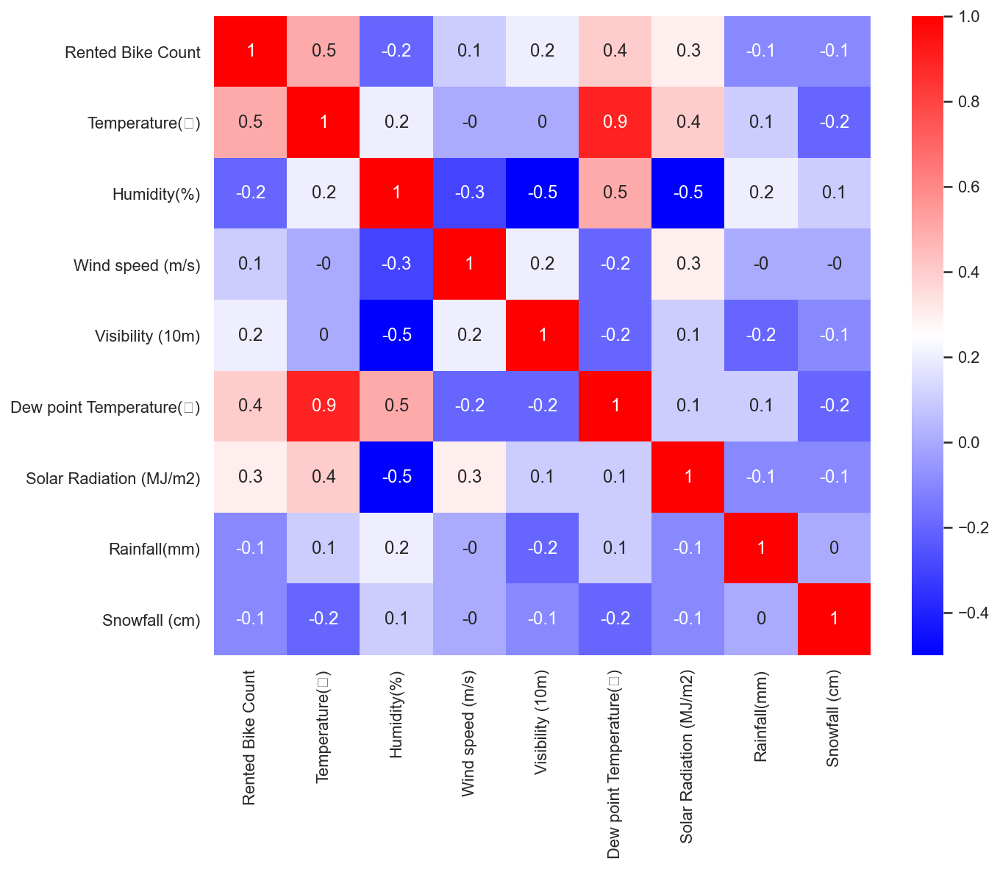

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

corr_mat = bike.corr().round(1)
sns.set(rc={'figure.figsize' :(10,8)})
sns.heatmap(data=corr_mat, annot=True, cmap='bwr');

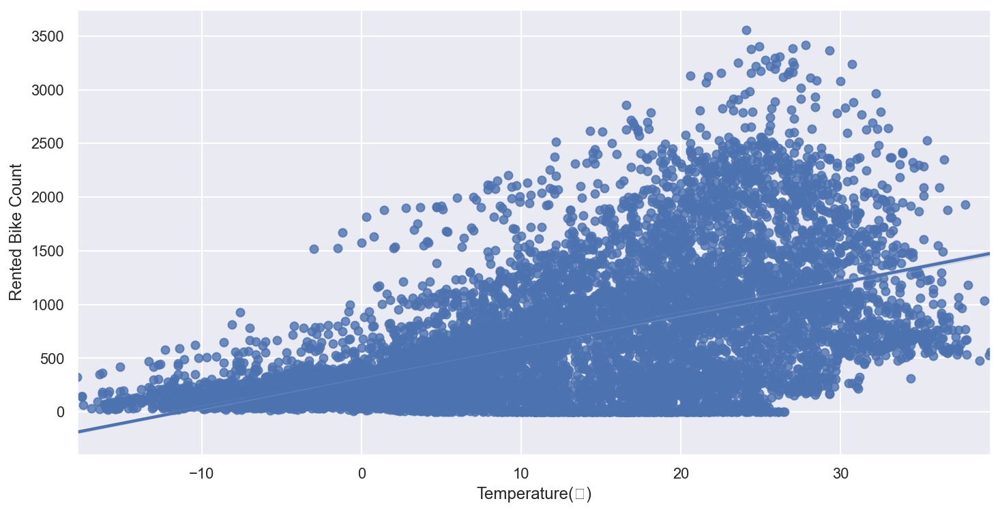

In [20]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(12,6)})
#fig, ax = plt.subplots(ncols=2)
sns.regplot(x='Temperature(℃)', y='Rented Bike Count', data=bike);
#, ax=ax[0]
#sns.regplot(x='Holiday', y='Rented Bike Count', data=bike, ax=ax[1]);

#### 회귀분석을 위한 학습, 테스트 데이터셋 분리

In [21]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

x = bike.drop('Rented Bike Count', axis=1)
y = bike['Rented Bike Count']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2,
                                                           random_state=13)
np.unique(y_train, return_counts=True)

(array([   0,    2,    3, ..., 3404, 3418, 3556], dtype=int64),
 array([247,   1,   1, ...,   1,   1,   1], dtype=int64))

#### 선형회귀 모델 만들기

In [22]:
import statsmodels.api as sm

lm = sm.OLS(y_train, x_train).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Rented Bike Count   R-squared (uncentered):                   0.721
Model:                            OLS   Adj. R-squared (uncentered):              0.721
Method:                 Least Squares   F-statistic:                              2264.
Date:                Thu, 25 Mar 2021   Prob (F-statistic):                        0.00
Time:                        06:31:27   Log-Likelihood:                         -53523.
No. Observations:                7008   AIC:                                  1.071e+05
Df Residuals:                    7000   BIC:                                  1.071e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Temperature(℃)              66.7930      1.836     36.377      0.000      63.194      70.392
Humidity(%)                 -1.2779      0.218     -5.858      0.000      -1.706      -0.850
Wind speed (m/s)            54.7244      6.316      8.664      0.000      42.343      67.106
Visibility (10m)             0.0214      0.012      1.853      0.064      -0.001       0.044
Dew point Temperature(℃)   -33.5347      1.701    -19.710      0.000     -36.870     -30.199
Solar Radiation (MJ/m2)   -124.2501      9.726    -12.774      0.000    -143.317    -105.183
Rainfall(mm)               -51.4735      5.252     -9.801      0.000     -61.769     -41.178
Snowfall (cm)               32.3509     14.350      2.254      0.024       4.221      60.480
==============================================================================
Omnibus:                      820.855   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1402.065
Skew:                           0.802   Prob(JB):                    3.51e-305
Kurtosis:                       4.494   Cond. No.                     3.75e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.75e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### 개념확인
    - F-statistic(F통계량)수치 확인
        - 회귀식의 유의성 검정에 사용하는 값으로, F통계량에 대한 p-value인 Prob(F-statistic) 수치와 함께 봐야함.
        - 일반적으로 p-value가 0.05 이하면 'F통계량이 유의한 의미를 가진다'라는 결론을 내려도 무방하며
          이는 회귀분석이 유의미한 결과를 가진다는 것을 의미
    - P>|t| 라는 정보는 각 피처의 검정 통계량(t-statistic)이 얼마나 유의미한지 p-value를 나타내는 것

#### 회귀 분석 계수 학습& 학습된 계수 출력


In [23]:
reg =linear_model.LinearRegression()
model =reg.fit(x_train, y_train)

# 학습된 계수출력
print(reg.coef_)

[ 3.21055896e+01 -1.18922161e+01  5.15831265e+01 -1.21011059e-02
  3.87775676e+00 -1.19571603e+02 -4.56901454e+01  4.09148008e+01]


#### 어떤 피쳐가 가장 영향력이 강한 피쳐일까

findfont: Font family ['NanumGothic0TF'] not found. Falling back to DejaVu Sans.
findfont: Font family ['NanumGothic0TF'] not found. Falling back to DejaVu Sans.


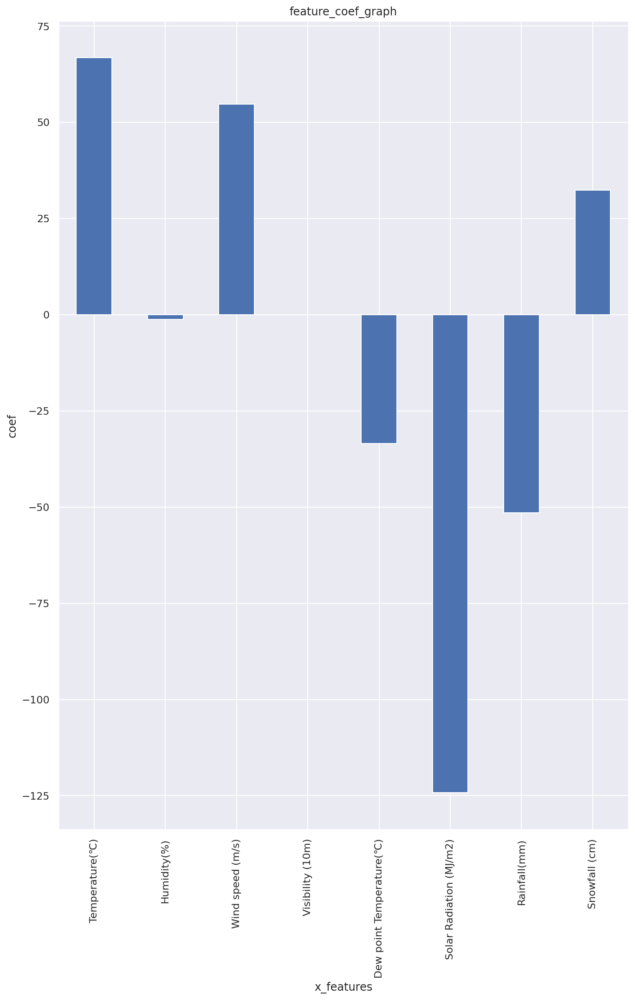

In [24]:
mpl.rc('font', family='NanumGothic0TF')
plt.rcParams['figure.figsize']= [11,16]

#회귀 계수를 리스트로 반환
coefs = lm.params.tolist()
coefs_series = pd.Series(coefs)

#변수명을 리스트로 반환
x_labels = lm.params.index.tolist()

#회귀계수 출력
ax = coefs_series.plot(kind='bar')
ax.set_title('feature_coef_graph')
ax.set_xlabel('x_features')
ax.set_ylabel('coef')
ax.set_xticklabels(x_labels);

#### 예측

In [25]:
predictions = lm.predict(x_test)
predictions

7043     571.746179
5999    1133.692869
2276     442.325649
961        3.313110
7548     889.607434
           ...     
1005     -46.280031
2714     528.324224
5039     645.191568
4642     825.662197
4163     882.767823
Length: 1752, dtype: float64

#### 실제 test값

In [26]:
y_test

7043     111
5999    1136
2276     578
961       78
7548     967
        ... 
1005     162
2714     305
5039     931
4642     971
4163    1012
Name: Rented Bike Count, Length: 1752, dtype: int64

#### 예측값 및 실제값 비교

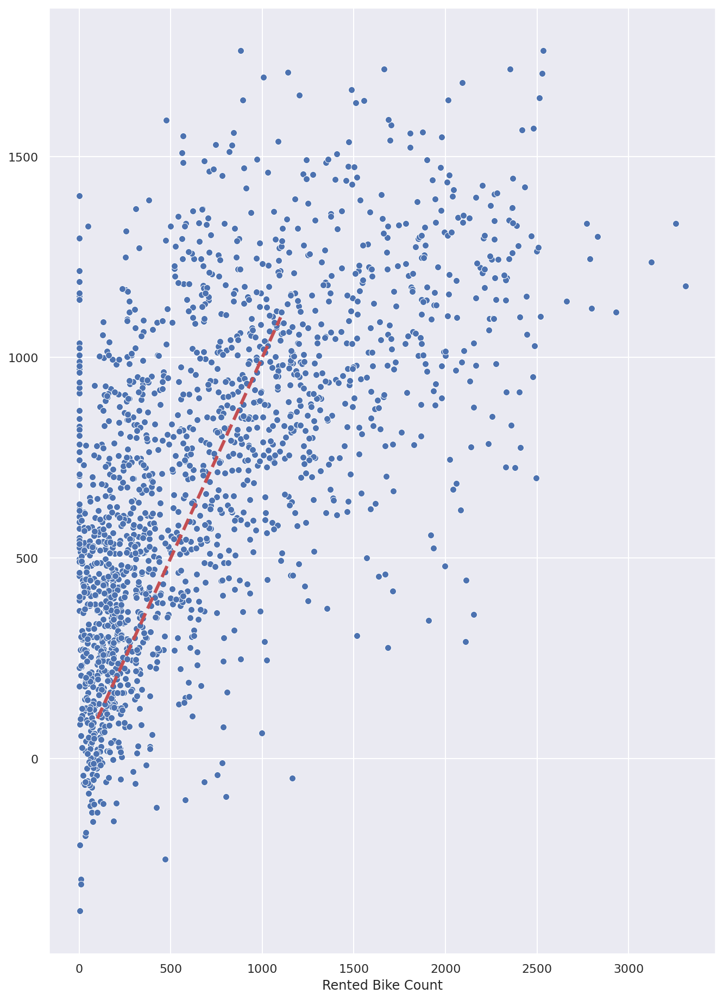

In [27]:
sns.scatterplot(y_test, predictions);
plt.plot([100, 1100], [100,1100], 'r', ls='dashed', lw=3);

### 3. 평가

#### Linear Regression

In [28]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(x_train, y_train)

LinearRegression()

In [29]:
import numpy as np
from sklearn.metrics import mean_squared_error

pred_tr = reg.predict(x_train)
pred_test = reg.predict(x_test)
rmse_tr = (np.sqrt(mean_squared_error(y_train, pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test, pred_test)))

print('RMSE of Train Data: ', rmse_tr)
print('RMSE of Test Data: ', rmse_test)

RMSE of Train Data:  499.6000785012318
RMSE of Test Data:  504.12044149319263


#### 예측 모델 평가하기

In [30]:
#reg = LinearRegression()
#reg.fit(x_train, y_train)

print(reg.score(x_train, y_train))
print(reg.score(x_test, y_test))

0.3954586543529801
0.4063129938538965


### Boxplot 으로 비교

In [31]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Box(y=x['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x['Snowfall (cm)'], name='Snowfall'))


fig.show()

### MinMaxScaler, StandardScaler, RobustScaler

In [32]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

MMS = MinMaxScaler()
SS = StandardScaler()
RS = RobustScaler()

SS.fit(x)
MMS.fit(x)
RS.fit(x_train)

x_ss = SS.transform(x)
x_mms = MMS.transform(x)
x_rs = RS.transform(x_train)

In [33]:
x_ss_pd = pd.DataFrame(x_ss, columns=x.columns)
x_mms_pd = pd.DataFrame(x_mms, columns=x.columns)
x_rs_pd = pd.DataFrame(x_rs, columns=x.columns)

### minmax / standard / robust 스케일링 적용 후 결과

In [34]:
x_ss_pd.describe()

,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03
mean,-7.169557e-16,1.837825e-16,-1.358312e-16,2.045599e-15,1.453505e-15,-4.465327e-15,1.918810e-15,-1.404875e-14
std,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00
min,-2.568868e+00,-2.859660e+00,-1.664583e+00,-2.317786e+00,-2.655039e+00,-6.551317e-01,-1.317999e-01,-1.718911e-01
25%,-7.855668e-01,-7.969184e-01,-7.960588e-01,-8.167930e-01,-6.718274e-01,-6.551317e-01,-1.317999e-01,-1.718911e-01
50%,6.840822e-02,-6.022497e-02,-2.170429e-01,4.293764e-01,7.857709e-02,-6.436202e-01,-1.317999e-01,-1.718911e-01
75%,8.051710e-01,7.746943e-01,5.549784e-01,9.258713e-01,8.213244e-01,4.154376e-01,-1.317999e-01,-1.718911e-01
max,2.220090e+00,1.953404e+00,5.476614e+00,9.258713e-01,1.770816e+00,3.396916e+00,3.089303e+01,1.997826e+01


In [35]:
x_mms_pd.describe()

,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,0.536415,0.594145,0.233096,0.714559,0.599893,0.161679,0.004248,0.008531
std,0.208826,0.207780,0.140041,0.308312,0.225958,0.246803,0.032234,0.049630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.372378,0.428571,0.121622,0.462747,0.448097,0.000000,0.000000,0.000000
50%,0.550699,0.581633,0.202703,0.846934,0.617647,0.002841,0.000000,0.000000
75%,0.704545,0.755102,0.310811,1.000000,0.785467,0.264205,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [36]:
x_rs_pd.describe()

,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,7008.000000,7008.000000,7008.000000,7008.000000,7008.000000,7008.000000,7008.000000,7008.000000
mean,-0.039980,0.034434,0.161519,-0.245677,-0.046043,0.594486,0.148045,0.073059
std,0.631905,0.635990,0.744499,0.576603,0.666138,0.918444,1.173698,0.435068
min,-1.670213,-1.781250,-1.071429,-1.584440,-1.820513,-0.010526,0.000000,0.000000
25%,-0.537234,-0.468750,-0.428571,-0.712524,-0.497436,-0.010526,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.462766,0.531250,0.571429,0.287476,0.502564,0.989474,0.000000,0.000000
max,1.372340,1.281250,4.214286,0.287476,1.143590,3.694737,35.000000,8.800000


#### MinMaxScaler

In [37]:
fig = go.Figure()
fig.add_trace(go.Box(y=x_mms_pd['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x_mms_pd['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x_mms_pd['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x_mms_pd['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x_mms_pd['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x_mms_pd['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x_mms_pd['Snowfall (cm)'], name='Snowfall'))

fig.show()

#### StandardScaler

In [38]:
fig = go.Figure()
fig.add_trace(go.Box(y=x_ss_pd['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x_ss_pd['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x_ss_pd['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x_ss_pd['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x_ss_pd['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x_ss_pd['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x_ss_pd['Snowfall (cm)'], name='Snowfall'))

fig.show()

In [39]:
fig = go.Figure()
fig.add_trace(go.Box(y=x_rs_pd['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x_rs_pd['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x_rs_pd['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x_rs_pd['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x_rs_pd['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x_rs_pd['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x_rs_pd['Snowfall (cm)'], name='Snowfall'))

fig.show()

#### 피처들간 상관관계

findfont: Font family ['NanumGothic0TF'] not found. Falling back to DejaVu Sans.


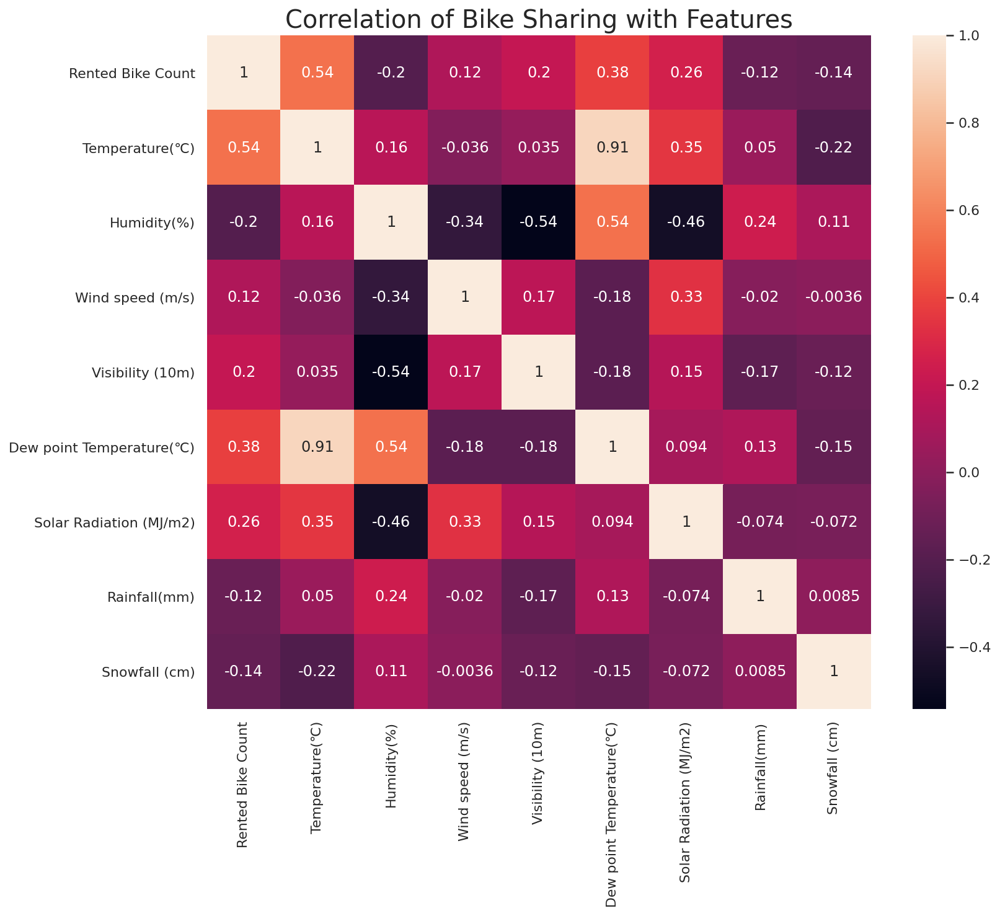

In [40]:
plt.figure(figsize = (12,10))
plt.title('Correlation of Bike Sharing with Features', fontsize=20)
sns.heatmap(bike.corr(),annot=True);

### 다중 공선성 확인: 회귀 분석 예측 성능을 높이기 위한 방법

In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

#피처마다의 VIF 계수를 출력
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(x.values, i)  for i in range(x.shape[1])]
vif["features"] = x.columns
vif.round(1)

,VIF Factor,features
0,29.1,Temperature(℃)
1,5.1,Humidity(%)
2,4.5,Wind speed (m/s)
3,9.1,Visibility (10m)
4,15.2,Dew point Temperature(℃)
5,2.8,Solar Radiation (MJ/m2)
6,1.1,Rainfall(mm)
7,1.1,Snowfall (cm)


### Scaling 후  모델평가

In [42]:
reg = LinearRegression()
reg.fit(x_mms, y_train)

ValueError: Found input variables with inconsistent numbers of samples: [8760, 7008]

In [ ]:
pred_tr = reg.predict(x_train)
pred_test = reg.predict(x_test)
rmse_tr = (np.sqrt(mean_squared_error(y_train, pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test, pred_test)))

print('RMSE of Train Data: ', rmse_tr)
print('RMSE of Test Data: ', rmse_test)

### 성능확인

In [ ]:
plt.scatter(y_test, pred_test)
plt.plot([0,30000],[0,30000]);

### 교차검증

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(reg,X_mms, y_train, scoring = 'neg_mean_squared_error', cv=10)

X_mms_rmse_scores = np.sqrt(-scores)

In [ ]:
def display_scores(scores):
    print("점수", scores)
    print("평균", scores.mean())
    print("표준 편차", scores.std())
    
display_scores(X_mms_rmse_scores)

### Decision Tree Regressor
- Decision Tree 이용한 회귀모델

In [ ]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor(random_state=13)
tree_reg.fit(X_mms, y_train)

In [ ]:
predictions = tree_reg.predict(X_mms)
tree_mse = mean_squared_error(y_train, predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

### 교차 검증

In [ ]:
scores = cross_val_score(tree_reg,x_mms, y_train, scoring = 'neg_mean_squared_error', cv=10)

tree_x_mms_rmse_scores = np.sqrt(-scores)

### 결과

In [ ]:
display_scores(tree_x_mms_rmse_scores)

### RandomForest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor(n_estimators=100, random_state=13)
forest_reg.fit(x_mms, y_train)

In [ ]:
predictions = forest_reg.predict(x_mms)
forest_mse = mean_squared_error(y_train, predictions)
forest_rmse = np.sqrt(forest_mse)
forest_rmse

In [ ]:
forest_scores = cross_val_score(forest_reg, x_mms, y_train,
                               scoring="neg_mean_squared_error", cv=10)

forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

### grid search 

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators':[3, 10, 30], 'max_features':[2,4,6,8]},
    {'bootstrap' : [False], 'n_estimators':[3,10], 'max_features':[2,3,4]},
]

forest_reg = RandomForestRegressor(random_state=13)
grid

####  robust 적용해서 학습
- 이상치 문제를 최소화